In [1]:
from fff import FreeFormFlow
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

INFO: Using pytorch backend
/tmp/ipykernel_1646496/3213488739.py:5: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
from mlae.evaluate import ensure_list, build_mesh

@torch.no_grad()
def plot_grid(ax, mapping, pos_min, pos_max, resolution=25,
              sub_resolution=0, color="black", linewidth=1, linestyle="-",
              pos_in_filter=None, device=None, dtype=None, **kwargs):
    for row_mode, this_resolution in zip([True, False],
                                         ensure_list(resolution, 2)):
        lines_resolution = [this_resolution,
                            this_resolution * (sub_resolution + 1)][::-1 if row_mode else 1]
        x, y, pos = build_mesh(pos_min, pos_max, lines_resolution,
                               device=device, dtype=dtype)
        if pos_in_filter is not None:
            pos[~pos_in_filter(pos)] = float("nan")
        pos_out = mapping(pos).cpu()
        pos_new = pos_out.reshape((*x.shape, -1)).numpy()
        if row_mode:
            segs = pos_new.transpose(1, 0, 2)
        else:
            segs = pos_new
        ax.plot(segs[:, :, 0], segs[:, :, 1], ls=linestyle, color=color,
                 lw=linewidth, **kwargs)
        


@torch.no_grad()
def plot_samples_grid(ax, model, resolution=20):
    extent = [-2, 2]
    def reconstruction(x):
        c = model.apply_conditions((x,)).condition
        return model(x, c)
    
    def distance_filter(pos):
        dist = torch.min(((pos.unsqueeze(0) - model.val_data[:][0].unsqueeze(1))**2).sum(dim=2), dim=0)[0]
        return dist < 0.1
    
    plot_grid(ax, lambda x: x, *extent, color="0.7", resolution=resolution, pos_in_filter=distance_filter)
    plot_grid(ax, reconstruction, *extent, sub_resolution=50, resolution=resolution, pos_in_filter=distance_filter) 
    samples = model.sample((10000,)).cpu().detach().numpy()
    ax.scatter(*samples.T, alpha=0.5, s=2)
    gt = model.val_data[:10000][0].T
    ax.scatter(*gt+torch.randn_like(gt)*model.hparams.noise, alpha=0.5, s=2)
    ax.set_xlim(extent)
    ax.set_ylim(extent)

ModuleNotFoundError: No module named 'mlae'

In [3]:
from matplotlib.colors import LogNorm


def reconstruction_error(x, model):
    c = model.apply_conditions((x,)).condition
    return torch.sum((model(x, c) - x)**2, dim=1).cpu().detach().numpy()
    

def jacobian_error(x, model):
    c = model.apply_conditions((x,)).condition
    z, jac_enc = model._encoder_jac(x, c)
    x1, jac_dec = model._decoder_jac(z, c)
    return torch.sqrt(torch.sum((jac_enc @ jac_dec - torch.eye(z.shape[1]).unsqueeze(0))**2, dim=(1, 2))).cpu().detach().numpy()
    

def plot_autoencoder_samples_and_error_background(ax, model, error_fct=reconstruction_error, grid_size=50):
    # Create a grid of points
    x = np.linspace(-3, 3, grid_size)
    y = np.linspace(-3, 3, grid_size)
    X, Y = np.meshgrid(x, y)
    
    # Flatten X and Y to create a batch of points
    points = np.vstack([X.ravel(), Y.ravel()]).T
    
    # Compute reconstruction error for the batch of points
    Z = error_fct(torch.from_numpy(points).float(), model).reshape(grid_size, grid_size)
    
    # Ensure Z has no zeros (since log(0) is undefined) by replacing zeros with a very small number
    Z[Z == 0] = 1e-10
    
    # Plot the background based on reconstruction error using a logarithmic scale
    contour = ax.contourf(X, Y, Z, levels=50, cmap='viridis', norm=LogNorm(vmin=1e-6, vmax=1000))

    # Add colorbar for the contour
    fig = ax.figure  # Get the figure object for the axis
    cbar = fig.colorbar(contour, ax=ax)  # Add the colorbar to the plot
    cbar.set_label(f'{" ".join(error_fct.__name__.split("_"))}')  # Optionally, set the label for the colorbar

    samples = model.sample((500,)).cpu().detach().numpy()
    ax.scatter(*samples.T, color='white', edgecolor='black', label='Samples', alpha=0.2, s=2)
    gt = model.val_data[:500][0]
    _, ind  = torch.sort(gt[:,0], dim=0)
    gt = gt[ind]
    
    ax.plot(*gt.T, color='red', label='Samples', alpha=0.4)
    
    ax.set_xlim([-3, 3])
    ax.set_ylim([-3, 3])
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(f'Autoencoder Samples with Background as {" ".join(error_fct.__name__.split("_"))}')
    ax.legend()

# Sine models

## Regular sine model

In [ ]:
model = fff.FreeFormFlow.load_from_checkpoint(
    "lightning_logs/m_256_128_1_oclr/version_1/checkpoints/last.ckpt"
)

/home/armand/miniconda3/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


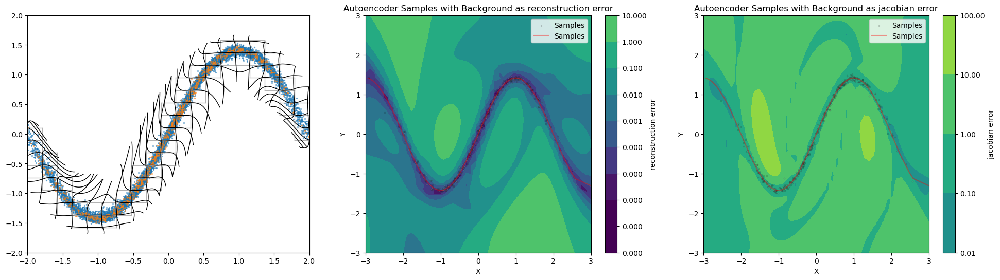

In [4]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF/lightning_logs/version_49/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

## Faster sine model

### Sin activations

#### No regularizer

NLL Encoder: 1.03 
NLL Decoder: 0.78


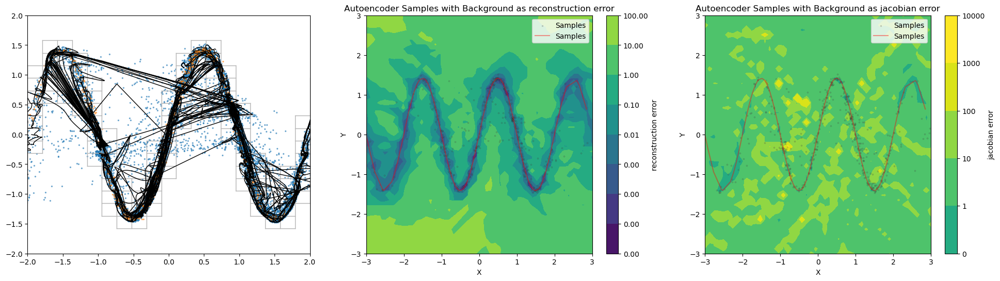

In [145]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_141/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.03 \nNLL Decoder: 0.78")

#### Regularizer no detach

/home/armand/miniconda3/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


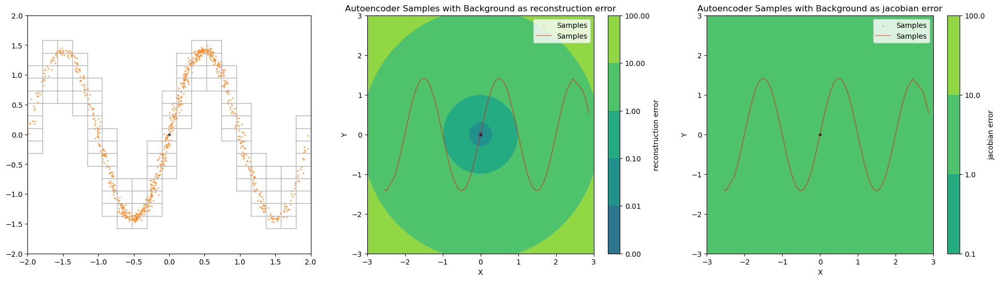

In [4]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_144/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

#### Regularizer detach

NLL Encoder: 0.79 
NLL Decoder: 0.76


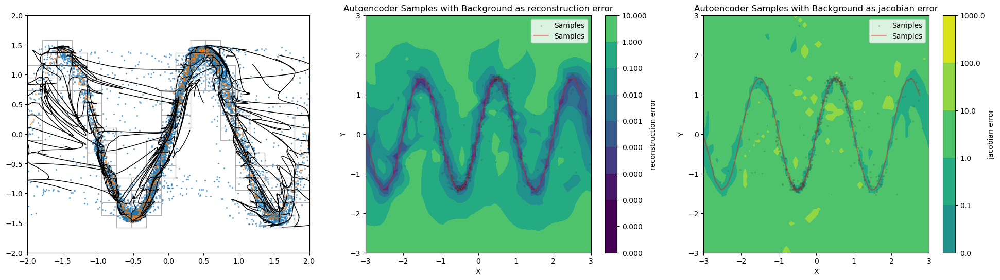

In [144]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_146/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.79 \nNLL Decoder: 0.76")

#### Regularizer Encoder only

NLL Encoder: 1.44 
NLL Decoder: 1.18


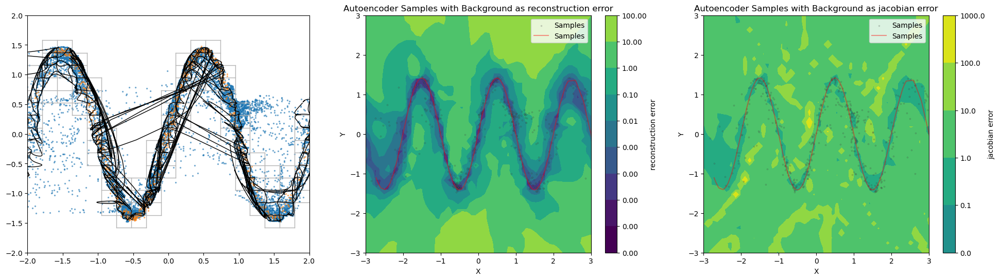

In [146]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_148/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.44 \nNLL Decoder: 1.18")

#### Regularizer decoder only no detach

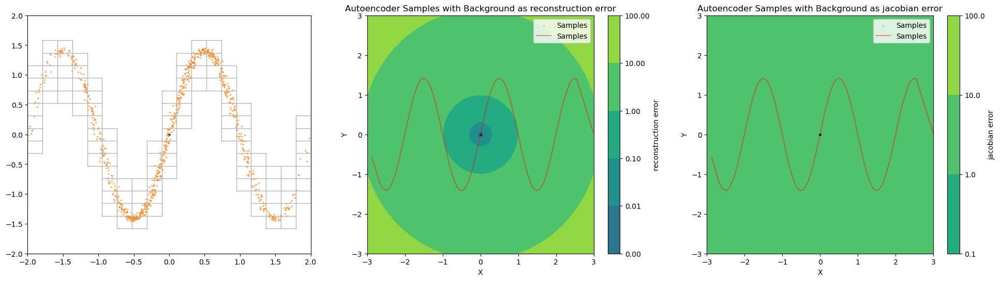

In [112]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_150/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

#### Regularizer decoder only detach

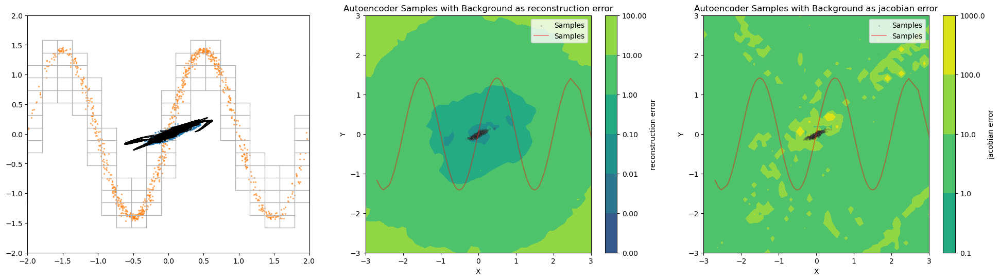

In [120]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_152/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

### ReLU activations

#### No regularizer

NLL Encoder: 0.82 
NLL Decoder: 0.83


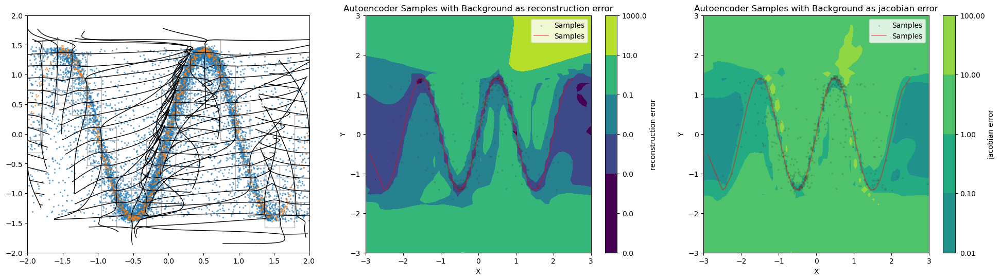

In [147]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_140/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.82 \nNLL Decoder: 0.83")

#### Regularizer no detach

NLL Encoder: 1.02 
NLL Decoder: 1.02


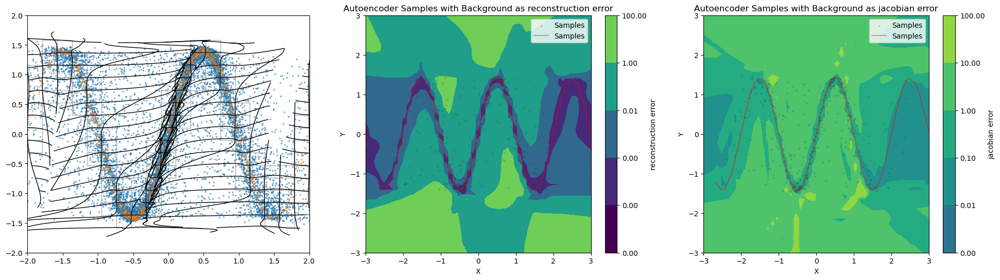

In [148]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_142/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.02 \nNLL Decoder: 1.02")

#### Regularizer detach

NLL Encoder: 0.78 
NLL Decoder: 0.76


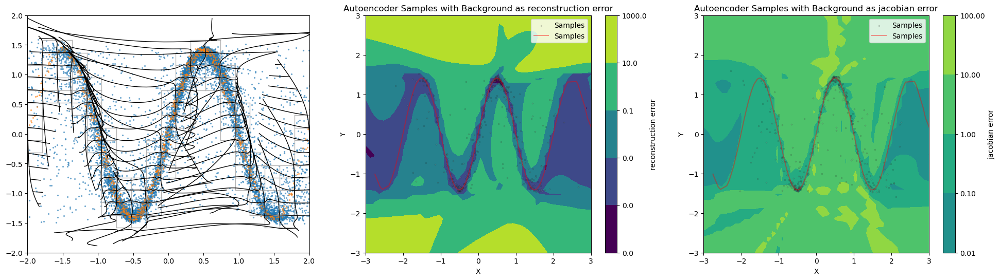

In [149]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_145/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.78 \nNLL Decoder: 0.76")

#### Regularizer encoder only

NLL Encoder: 1.10 
NLL Decoder: 1.08


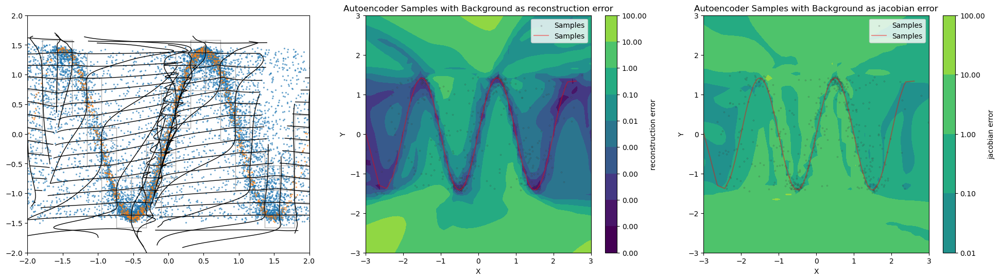

In [150]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_147/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.10 \nNLL Decoder: 1.08")

#### Regularizer decoder only no detach

NLL Encoder: 0.88 
NLL Decoder: 0.89


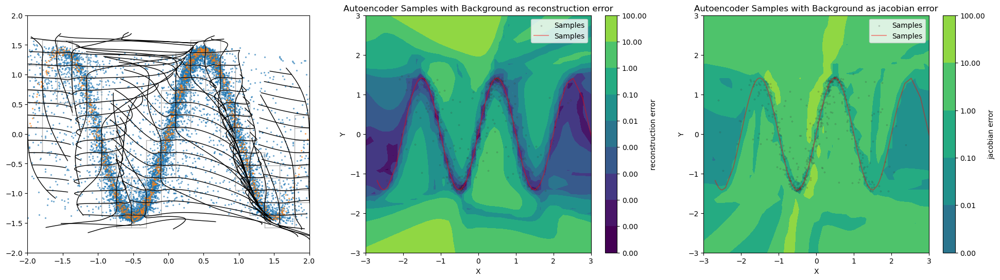

In [151]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_149/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.88 \nNLL Decoder: 0.89")

#### Regularizer decoder only detach

NLL Encoder: 0.90 
NLL Decoder: 0.92


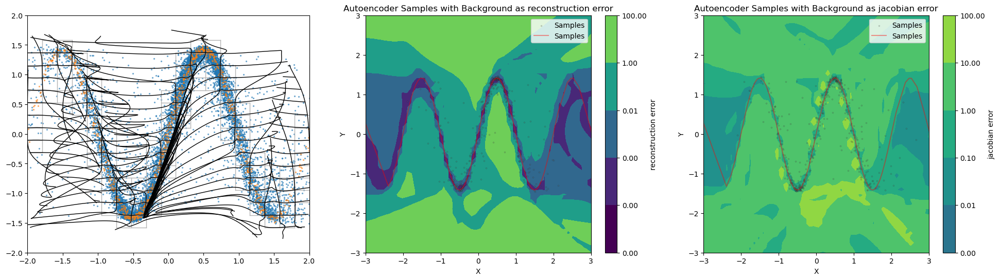

In [152]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_151/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.90 \nNLL Decoder: 0.92")

### Different Loss Weights

NLL Encoder: 1.03 
NLL Decoder: 0.78


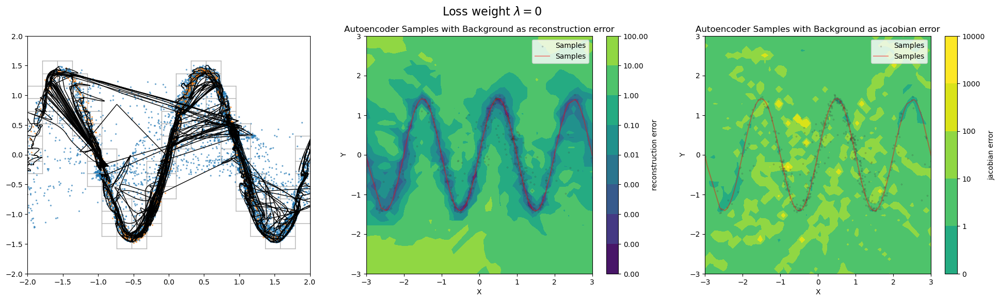

In [143]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_141/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
plt.suptitle("Loss weight $\lambda = 0$", fontsize=16)
plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.03 \nNLL Decoder: 0.78")

NLL Encoder: 0.72 
NLL Decoder: 0.58


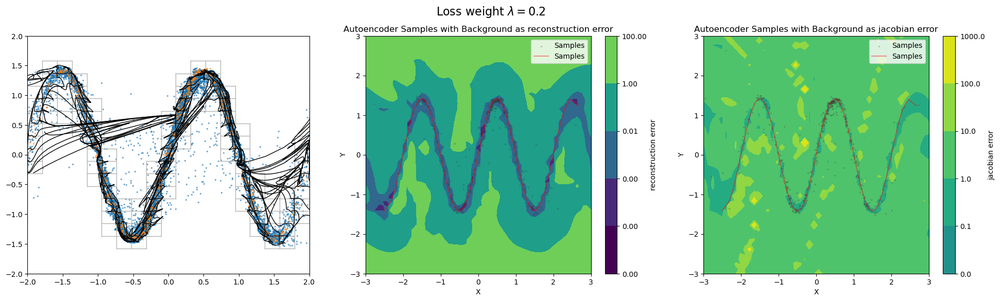

In [141]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_154/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
plt.suptitle("Loss weight $\lambda = 0.2$", fontsize=16)
plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.72 \nNLL Decoder: 0.58")

NLL Encoder: 0.79 
NLL Decoder: 0.76


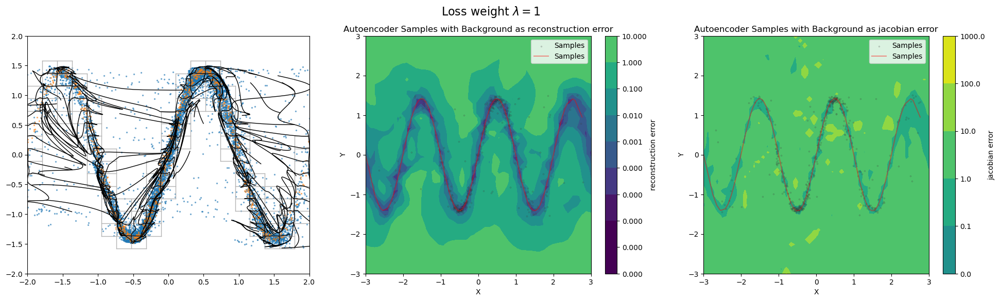

In [140]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_146/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
plt.suptitle("Loss weight $\lambda = 1$", fontsize=16)
plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.79 \nNLL Decoder: 0.76")

NLL Encoder: 1.38 
NLL Decoder: 1.38


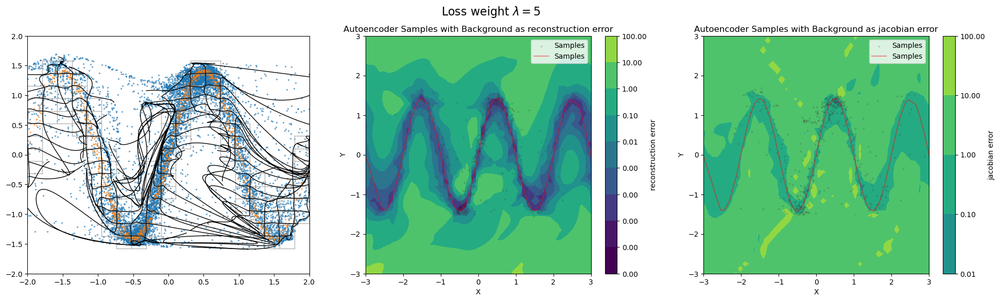

In [139]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_153/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
plt.suptitle("Loss weight $\lambda = 5$", fontsize=16)

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 1.38 \nNLL Decoder: 1.38")

### Positive definite regularization

#### ReLU activations

NLL Encoder: 0.90 
NLL Decoder: 0.88


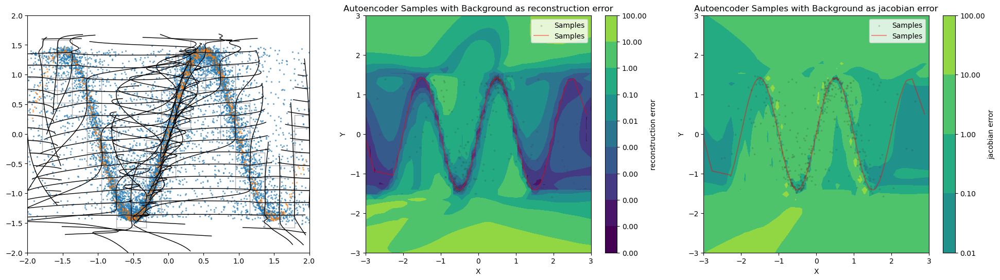

In [138]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_158/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.90 \nNLL Decoder: 0.88")

#### Sin activations

NLL Encoder: 0.50 
NLL Decoder: 0.45


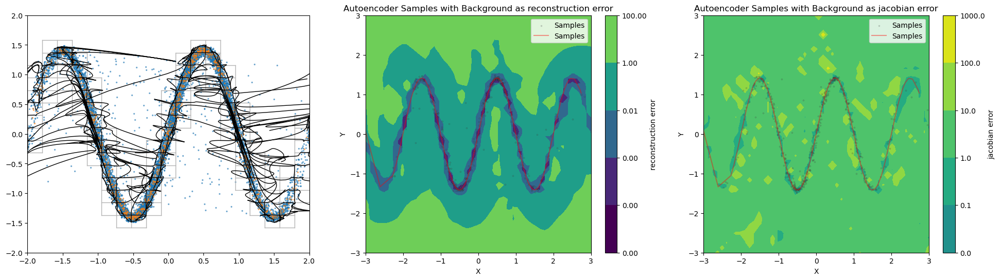

In [192]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_170/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.50 \nNLL Decoder: 0.45")

### Combined

NLL Encoder: 0.81 
NLL Decoder: 0.82


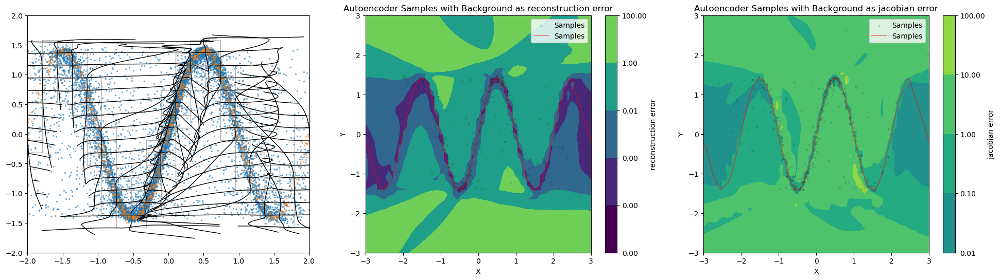

In [156]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_160/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.81 \nNLL Decoder: 0.82")

NLL Encoder: 0.43 
NLL Decoder: 0.43


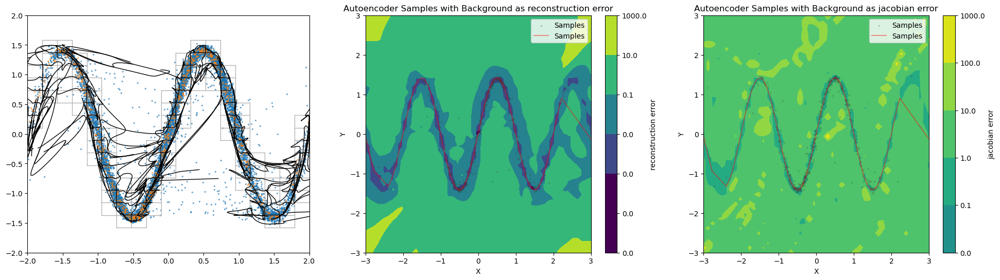

In [160]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_161/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.43 \nNLL Decoder: 0.43")

### Latent regularizations

#### $||JJ - I||$

NLL Encoder: 0.40 
NLL Decoder: 0.36


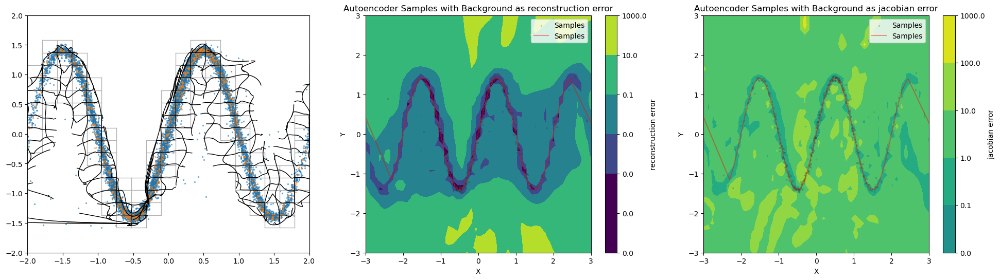

In [188]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_166/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.40 \nNLL Decoder: 0.36")

#### Positive Definite - bugged

NLL Encoder: 0.58 
NLL Decoder: 0.23


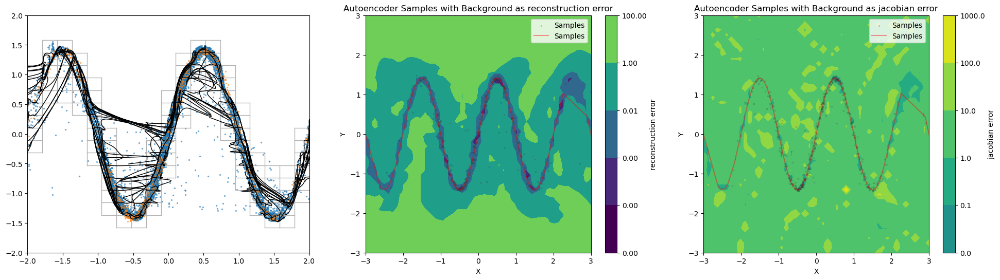

In [190]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_168/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.58 \nNLL Decoder: 0.23")

#### Positive Definite -- fixed

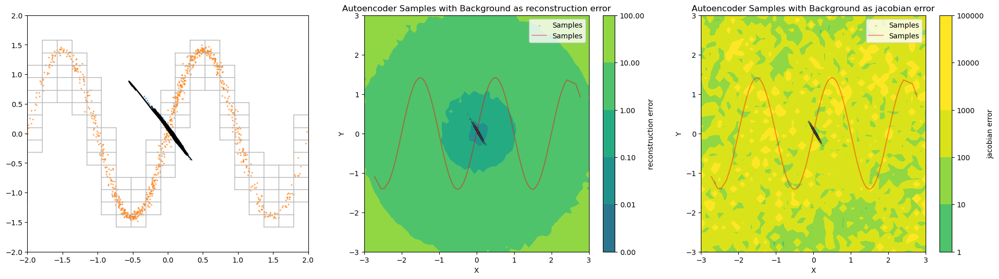

In [191]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_169/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

#### Combined -- fixed

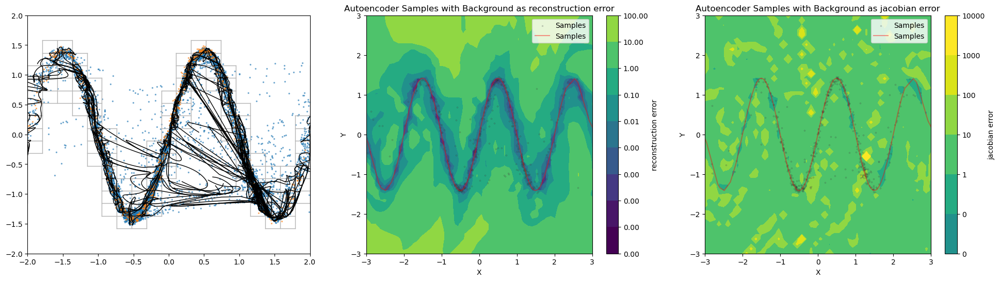

In [197]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_171/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

### Mixed:

####  Positive definite data and $||JJ - I||$ latent Detach

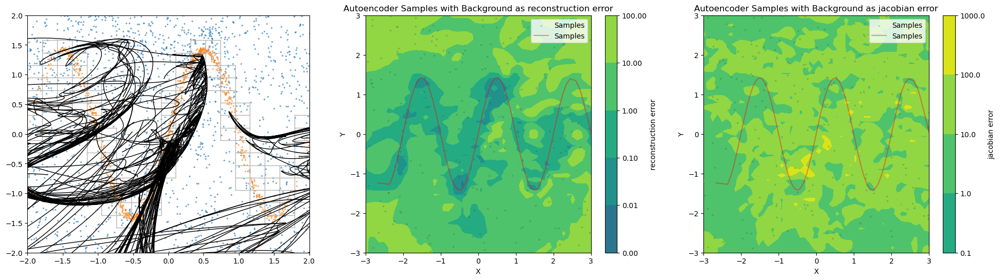

In [199]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_173/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

####  Positive definite data and $||JJ - I||$ latent No Detach

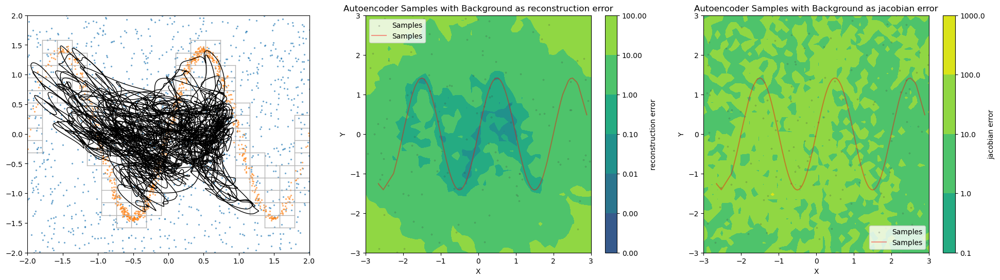

In [200]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_174/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

#### $||JJ - I||$ latent + data

NLL Encoder: 0.50 
NLL Decoder: 0.48


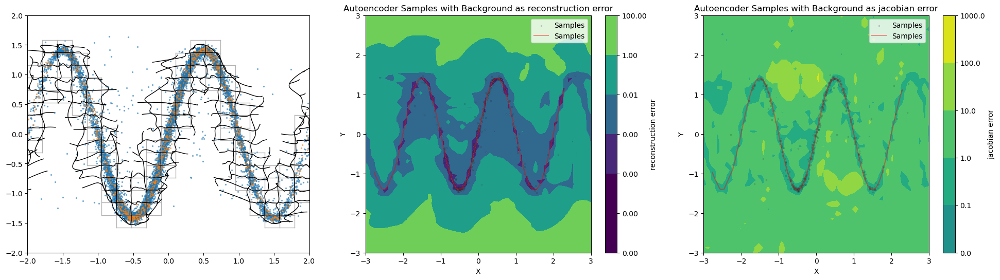

In [204]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_178/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)
print("NLL Encoder: 0.50 \nNLL Decoder: 0.48")

### Batchnorm

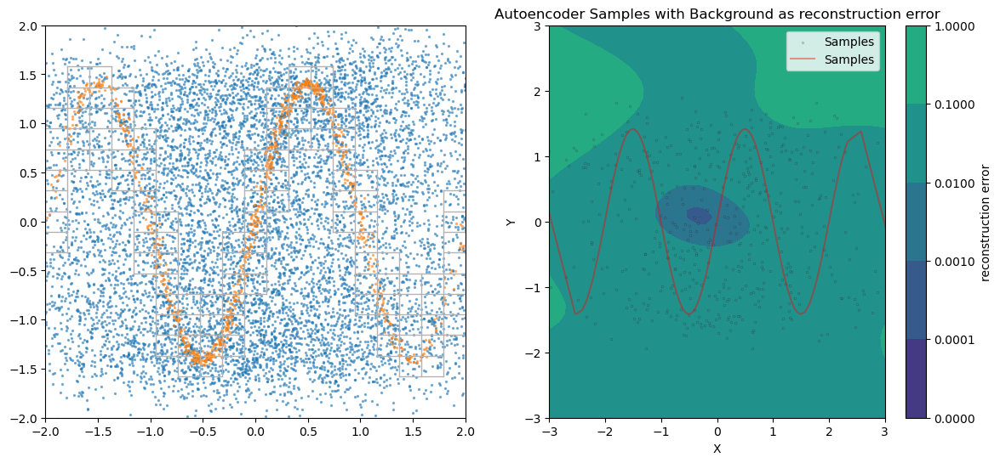

In [282]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_185/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
# plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

### Just make $\beta$ larger and train longer

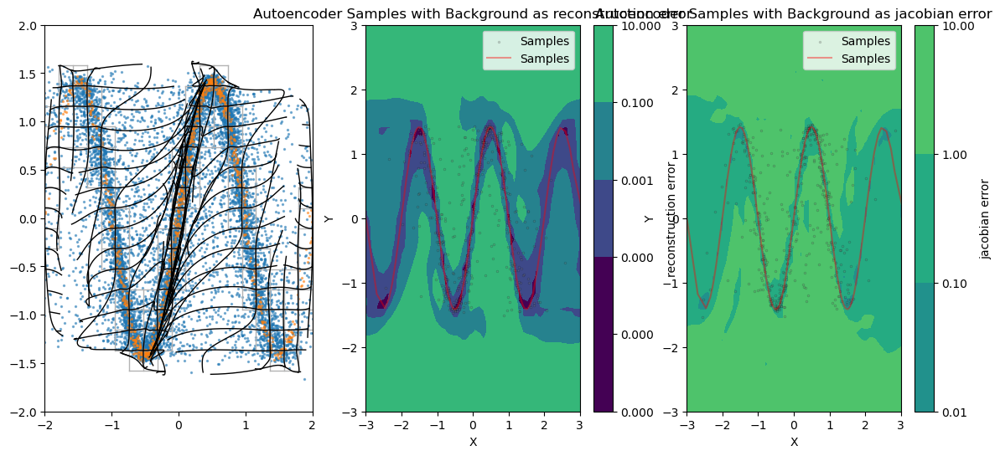

In [15]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/PhD/FFF-private/lightning_logs/version_189/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 3, figsize=(14, 6))

plot_samples_grid(axes[0], model)
plot_autoencoder_samples_and_error_background(axes[1], model, reconstruction_error)
plot_autoencoder_samples_and_error_background(axes[2], model, jacobian_error)

# Miniboone

In [5]:
from mlae.evaluate import ensure_list, build_mesh

def get_projection(x1, x2, x3):
    v1 = x2 - x1
    v2 = x3 - x1
    v2 = v2 - torch.dot(v2, v1) / torch.dot(v1, v1) * v1
    v1 = v1 / torch.linalg.norm(v1)
    v2 = v2 / torch.linalg.norm(v2)
    projection_matrix = torch.stack((v1, v2), dim=1)
    def project(x, rev=False):
        if not rev:
            return torch.matmul(x - x1.reshape(1, -1), projection_matrix)
        else:
            return torch.matmul(x, projection_matrix.T) + x1.reshape(1, -1)
    return project
    
    

@torch.no_grad()
def plot_grid_projected(ax, mapping, pos_min, pos_max, project, resolution=25,
              sub_resolution=0, color="black", linewidth=1, linestyle="-",
              pos_in_filter=None, device=None, dtype=None, **kwargs):
    for row_mode, this_resolution in zip([True, False],
                                         ensure_list(resolution, 2)):
        lines_resolution = [this_resolution,
                            this_resolution * (sub_resolution + 1)][::-1 if row_mode else 1]
        x, y, pos = build_mesh(pos_min, pos_max, lines_resolution,
                               device=device, dtype=dtype)
        if pos_in_filter is not None:
            pos[~pos_in_filter(pos)] = float("nan")
        pos_out = project(mapping(project(pos, rev=True).to(model.device)).cpu())
        pos_new = pos_out.reshape((*x.shape, -1)).numpy()
        if row_mode:
            segs = pos_new.transpose(1, 0, 2)
        else:
            segs = pos_new
        ax.plot(segs[:, :, 0], segs[:, :, 1], ls=linestyle, color=color,
                 lw=linewidth, **kwargs)
        
@torch.no_grad()
def plot_samples_grid_projected(ax, model, resolution=20):
    def reconstruction(x):
        x = x.to(model.device)
        c = model.apply_conditions((x,)).condition
        return model(x, c).to("cpu")
    
    def distance_filter(pos):
        dist = torch.min(((pos.unsqueeze(0) - model.val_data[:][0].unsqueeze(1))**2).sum(dim=2), dim=0)[0]
        return dist < 0.1
    
    gt = model.val_data[torch.randperm(len(model.val_data))][0][:]
    gt_noised = gt+torch.randn_like(gt)*model.hparams.noise
    max_rec = torch.argsort(torch.sum((reconstruction(gt_noised) - gt_noised)**2, dim=1))
    project = get_projection(*gt_noised[max_rec][:3])
    
    samples = model.sample((1000,)).cpu()
     
    ext_min = min(torch.min(project(samples)), torch.min(project(gt)))*1.02
    ext_max = max(torch.max(project(samples)), torch.max(project(gt)))*1.02
    
    extent = [ext_min.item(), ext_max.item()]

    
    ax.scatter(*project(reconstruction(gt_noised)).T, alpha=0.5, s=2)
    ax.scatter(*project(gt_noised).T, alpha=0.5, s=2)
        
    ax.scatter(*project(gt_noised[:3]).T, alpha=1.0, s=20, marker="x")
    ax.scatter(*project(reconstruction(gt_noised[:3])).T, alpha=1.0, s=20, marker="x")
   
    
    plot_grid_projected(ax, lambda x: x, *extent, project, color="0.7", resolution=resolution) # , pos_in_filter=distance_filter)
    plot_grid_projected(ax, reconstruction, *extent, project, sub_resolution=50, resolution=resolution) # , pos_in_filter=distance_filter) 

    ax.set_xlim(extent)
    ax.set_ylim(extent)
    #ax.axhline(0, color='black',linewidth=0.5)
    #ax.axvline(0, color='black',linewidth=0.5)

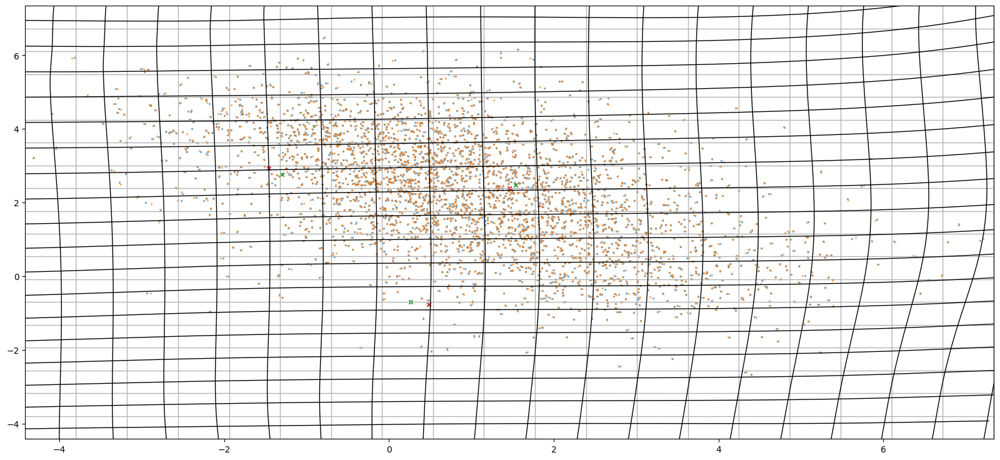

In [6]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_154/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 1, figsize=(20, 9))
plot_samples_grid_projected(axes, model)

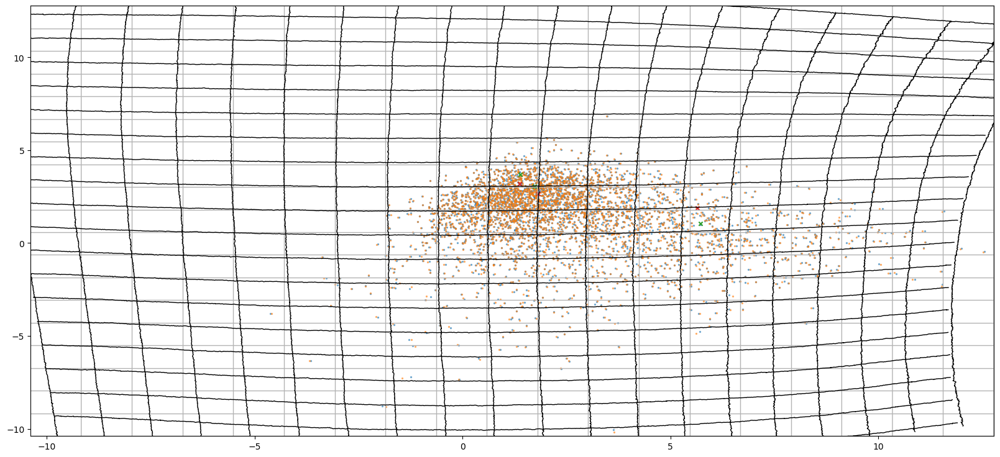

In [7]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_159/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 1, figsize=(20, 9))
plot_samples_grid_projected(axes, model)

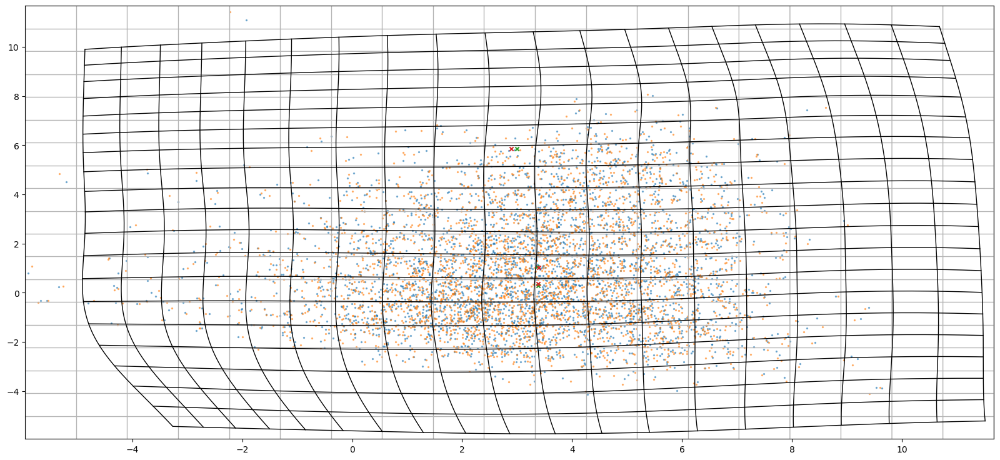

In [8]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_175/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 1, figsize=(20, 9))
plot_samples_grid_projected(axes, model)

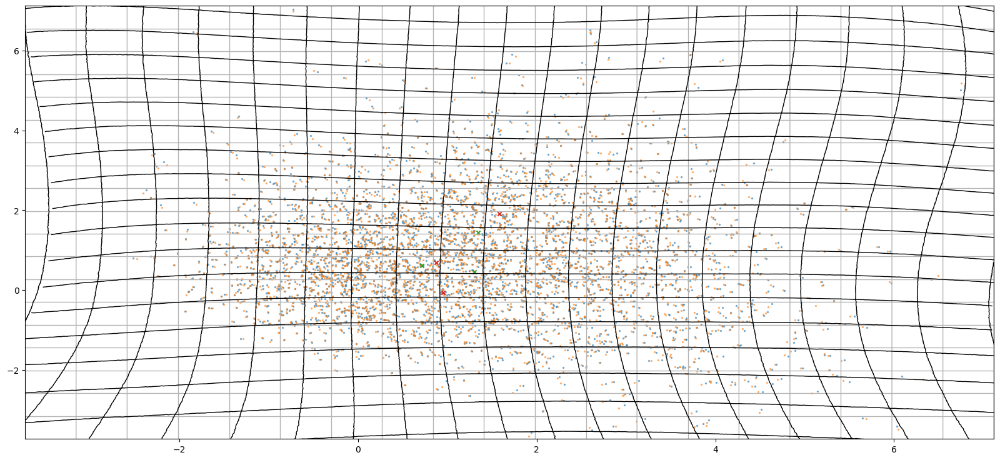

In [9]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_0/checkpoints/last.ckpt")
fig, axes = plt.subplots(1, 1, figsize=(20, 9))
plot_samples_grid_projected(axes, model)

In [11]:
with torch.no_grad():
    model.eval()
    x = (model.val_data[:10000][0].to("cuda"), )
    metrics = model.compute_metrics(x, 0)

metrics

{'z 1D-Wasserstein-1': tensor(0.0942, device='cuda:0'),
 'z std': tensor(0.9092, device='cuda:0'),
 'loss': tensor(6906717., device='cuda:0'),
 'nll': tensor(36.3802, device='cuda:0'),
 'vol_change_encoder': tensor(37.6967, device='cuda:0'),
 'vol_change_decoder': tensor(20.9333, device='cuda:0'),
 'nll_encoder': tensor(19.6168, device='cuda:0'),
 'nll_decoder': tensor(36.3802, device='cuda:0'),
 'reconstruction': tensor(2969889., device='cuda:0'),
 'noisy_reconstruction': tensor(2969888., device='cuda:0'),
 'std_noisy_reconstruction': tensor(2997571.2500, device='cuda:0'),
 'z_norm': tensor(5.8721, device='cuda:0'),
 'x1_norm': tensor(1723.0143, device='cuda:0'),
 'z_reconstruction': tensor(22904862., device='cuda:0'),
 'z_reconstruction_encoder': tensor(22904862., device='cuda:0'),
 'z_sample_reconstruction': tensor(23245382., device='cuda:0'),
 'x_sample_reconstruction': tensor(15352949., device='cuda:0'),
 'shuffled_reconstruction': tensor(2969888.2500, device='cuda:0')}

In [171]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_161/checkpoints/last.ckpt")

In [172]:
model.eval()
x = (model.val_data[:10000][0].to("cuda"), )
model.compute_metrics(x, 0)

{'z 1D-Wasserstein-1': tensor(0.0201, device='cuda:0'),
 'z std': tensor(0.9823, device='cuda:0'),
 'loss': tensor(0.2775, device='cuda:0'),
 'nll': tensor(10.2839, device='cuda:0'),
 'vol_change_encoder': tensor(50.0818, device='cuda:0'),
 'vol_change_decoder': tensor(49.9766, device='cuda:0'),
 'nll_encoder': tensor(10.1787, device='cuda:0'),
 'nll_decoder': tensor(10.2839, device='cuda:0'),
 'reconstruction': tensor(0.0208, device='cuda:0'),
 'noisy_reconstruction': tensor(0.0165, device='cuda:0'),
 'std_noisy_reconstruction': tensor(0.0167, device='cuda:0'),
 'z_norm': tensor(6.3732, device='cuda:0'),
 'x1_norm': tensor(6.0784, device='cuda:0'),
 'z_reconstruction': tensor(0.4775, device='cuda:0', grad_fn=<MeanBackward1>),
 'z_reconstruction_encoder': tensor(0.4775, device='cuda:0', grad_fn=<MeanBackward1>),
 'z_sample_reconstruction': tensor(0.6192, device='cuda:0', grad_fn=<MeanBackward1>),
 'x_sample_reconstruction': tensor(51.9677, device='cuda:0', grad_fn=<MeanBackward1>),
 's

In [174]:
model = FreeFormFlow.load_from_checkpoint("/home/armand/helix_store/fff-private-miniboone/lightning_logs/version_160/checkpoints/last.ckpt")

In [180]:
model.eval()
x = (model.val_data[:][0].to("cuda"), )
model.compute_metrics(x, 0)

{'z 1D-Wasserstein-1': tensor(0.0516, device='cuda:0'),
 'z std': tensor(0.9516, device='cuda:0'),
 'loss': tensor(2.6663, device='cuda:0'),
 'nll': tensor(13.8669, device='cuda:0'),
 'vol_change_encoder': tensor(45.2867, device='cuda:0'),
 'vol_change_decoder': tensor(45.1174, device='cuda:0'),
 'nll_encoder': tensor(13.6976, device='cuda:0'),
 'nll_decoder': tensor(13.8669, device='cuda:0'),
 'reconstruction': tensor(1.0124, device='cuda:0'),
 'noisy_reconstruction': tensor(1.0078, device='cuda:0'),
 'std_noisy_reconstruction': tensor(1.0232, device='cuda:0'),
 'z_norm': tensor(6.1515, device='cuda:0'),
 'x1_norm': tensor(5.9628, device='cuda:0'),
 'z_reconstruction': tensor(17.6864, device='cuda:0', grad_fn=<MeanBackward1>),
 'z_reconstruction_encoder': tensor(17.6864, device='cuda:0', grad_fn=<MeanBackward1>),
 'z_sample_reconstruction': tensor(16.7589, device='cuda:0', grad_fn=<MeanBackward1>),
 'x_sample_reconstruction': tensor(412.1605, device='cuda:0', grad_fn=<MeanBackward1>),

In [186]:
x_cond = model.apply_conditions(x)
rec = torch.sum((x_cond.x_noisy - model(x_cond.x_noisy, x_cond.condition))**2, -1)
rec

tensor([0.6507, 0.8302, 0.9615,  ..., 0.9410, 1.1546, 1.0000], device='cuda:0',
       grad_fn=<SumBackward1>)

In [187]:
torch.quantile(rec, 0.8)

tensor(1.1693, device='cuda:0', grad_fn=<SqueezeBackward4>)